# Data visualization

I am a data analyst tasked with helping investors from the "Shut Up and Take My Money" fund open a food establishment in Moscow. I need to prepare a report on the Moscow market to assist in selecting a location for their future establishment.

**My Work Plan:**

* Load and examine the data;

* Perform data preprocessing;

* Conduct data analysis;

* Consider the opening of a coffee shop

## Data preparation

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [5]:
data['name'] = data['name'].str.lower()

In [6]:
print(data.duplicated(subset=['name', 'address']).sum())
data[['name', 'address']].value_counts()

3


name                       address                                     
хлеб да выпечка            Москва, Ярцевская улица, 19                     2
раковарня клешни и хвосты  Москва, проспект Мира, 118                      2
more poke                  Москва, Волоколамское шоссе, 11, стр. 2         2
навруз                     Москва, Новоясеневский проспект, 1Б, корп. 2    1
на углях                   Москва, 5-я Кабельная улица, 8                  1
                                                                          ..
бенвенуто                  Москва, Сретенский бульвар, 6/1с1               1
беляшерия                  Москва, Тестовская улица, 1                     1
бельгийская брассери 0.33  Москва, Орликов переулок, 2/17                  1
белый лебедь               Москва, Михалковская улица, 38, стр. 6          1
ёрш                        Москва, улица Перерва, 58                       1
Length: 8403, dtype: int64

In [7]:
data = data.drop_duplicates(subset=['name', 'address'])

In [8]:
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64


In [9]:
pattern = '\,*,(([а-яА-Я1-9\-ё\s"]+)?(улица|переулок|шоссе|проспект|площадь|проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|)([а-яА-Яё1-9\-\s"]+)?)\,'
data['street'] = data['address'].str.extract(pat = pattern)[0]

In [10]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

## Data analysis

### Quantity of facilities per each category

In [11]:
categories = pd.DataFrame(data['category'].value_counts())
categories.columns=['quantity']
categories

,quantity
кафе,2377
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [12]:
px.bar(categories,
       x=categories.index,
       y='quantity',
       title='Distribution by categories',
       labels=dict(index='Сategories', quantity='Quantity', color='Place')).update_xaxes(tickangle=45)

In [13]:
# строим круговую диаграмму распределения заведений по категориям
fig = go.Figure(data=[go.Pie(labels=categories.index, values=categories['quantity'])])
fig.update_layout(title='Distribution by categories')
fig.show()

### Median quantity of seats per each category

In [14]:
# строим таблицу распределения мест по категориям
seats_category = pd.DataFrame(data.groupby(['category'],  as_index=False)['seats'].median())
seats_category = seats_category.sort_values(by='seats', ascending=False)
seats_category

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [15]:
# строим столбчаиую диграмму распределения мест по категориям
px.bar(seats_category,
       x=seats_category['category'],
       y='seats',
       title='Distribution of seats by categories',
       labels=dict(category='Categories', seats='Quantity of seats', color='Place')).update_xaxes(tickangle=30)

### Chain and independent facilities

In [16]:
chain = pd.DataFrame(data['chain'].value_counts())
chain.columns=['quantity']
chain.index = ['Не сетевое',  'Cетевое']
chain

,quantity
Не сетевое,5200
Cетевое,3203


In [17]:
px.bar(chain,
       x=chain.index,
       y='quantity',
       title='Distribution of chain and independent establishments',
       labels=dict(index='Chain or independent', quantity='Quantity'))

In [18]:
fig = go.Figure(data=[go.Pie(labels=chain.index, values=chain['quantity'])])
fig.update_layout(title='Chain or independent')
fig.show()

### Categories of chain facilities

In [19]:
chain_category = data[data['chain'] == 1]
chain_category = pd.DataFrame(chain_category['category'].value_counts())
chain_category.columns=['quantity']
chain_category

,quantity
кафе,779
ресторан,729
кофейня,720
пиццерия,330
быстрое питание,232
"бар,паб",168
булочная,157
столовая,88


In [20]:
px.bar(chain_category,
       x=chain_category.index,
       y='quantity',
       title='Distribution of chain facilities by categories',
       labels=dict(index='Categories', quantity='Quantity of chain facilities', color='Place')).update_xaxes(tickangle=30)

In [21]:
data1 = data.groupby('category', as_index=False)['name'].count()
data1.columns = ['category', 'общее число']
data2 = data[data['chain'] == 1].groupby('category', as_index=False)['name'].count()
data2.columns = ['category', 'число сетевых']
percentages_category = data1.merge(right=data2, on='category', how='inner')
percentages_category['% of chain facilities'] = (percentages_category['число сетевых']/percentages_category['общее число']*100).round(2)
percentages_category = percentages_category.sort_values(by='% of chain facilities', ascending=False)

In [22]:
px.bar(percentages_category,
       x='category',
       y='% of chain facilities',
       title='Percentage of chain facilities in each category',
       labels=dict(index='Category', quantity='% of chain facilities', color='Place')).update_xaxes(tickangle=30)

In [23]:
fig = go.Figure(data=[go.Pie(labels=chain_category.index, values=chain_category['quantity'])])
fig.update_layout(title='Distribution of chain facilities by categories')
fig.show()

### Топ 15 popular places

In [24]:
top_15_1= data[data['chain'] == 1].groupby('name')['category'].count().reset_index()
top_15_1 = top_15_1.sort_values(by='category', ascending=False).head(15)
name_category = data[['name', 'category']]
top_15 = top_15_1.merge(right=name_category, on='name', how='left')
top_15['name'] = top_15['name'].drop_duplicates()
top_15 = top_15.dropna()
top_15

,name,category_x,category_y
0,шоколадница,120,кофейня
120,домино'с пицца,76,пиццерия
197,додо пицца,74,пиццерия
271,one price coffee,71,кофейня
343,яндекс лавка,69,ресторан
412,cofix,65,кофейня
477,prime,50,ресторан
527,хинкальная,44,быстрое питание
571,кофепорт,42,кофейня
613,кулинарная лавка братьев караваевых,39,кафе


### Moscow districts

In [25]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [26]:
district_category = data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
district_category['all'] = district_category['бар,паб'] + district_category['булочная'] + district_category['быстрое питание'] + district_category['кафе'] + district_category['кофейня'] + district_category['пиццерия'] + district_category['ресторан'] + district_category['столовая']
district_category = district_category.sort_values(by='all', ascending=False)
district_category = district_category.drop('all', axis=1)
district_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66
Северный административный округ,68,39,58,235,193,77,188,41
Южный административный округ,68,25,85,264,131,73,202,44
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Западный административный округ,50,37,62,238,150,71,218,24
Восточный административный округ,53,25,71,272,105,72,160,40
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Северо-Западный административный округ,23,12,30,115,62,40,109,18


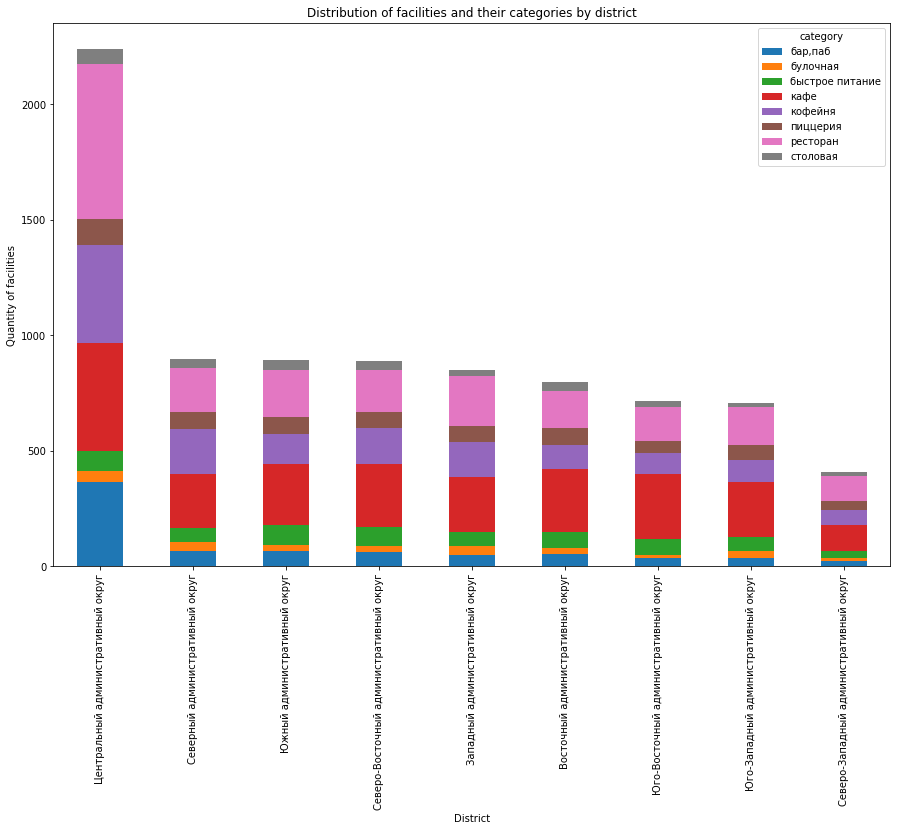

In [27]:
plot_1 = district_category.plot(kind='bar',
                                stacked=True,
                                figsize=(15, 10),
                                title='Distribution of facilities and their categories by district',
                                xlabel='District',
                                ylabel='Quantity of facilities'
)
plt.show()

### Average and median ratings by categories

In [28]:
rating_category = pd.DataFrame(data.groupby('category', as_index=False)['rating'].mean().round(3).sort_values(by='rating', ascending=False))
rating_category

,category,rating
0,"бар,паб",4.388
5,пиццерия,4.301
6,ресторан,4.290
4,кофейня,4.277
1,булочная,4.268
7,столовая,4.211
3,кафе,4.124
2,быстрое питание,4.050


In [29]:
median_category = pd.DataFrame(data.groupby('category', as_index=False)['rating'].median().sort_values(by='rating', ascending=False))
median_category

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


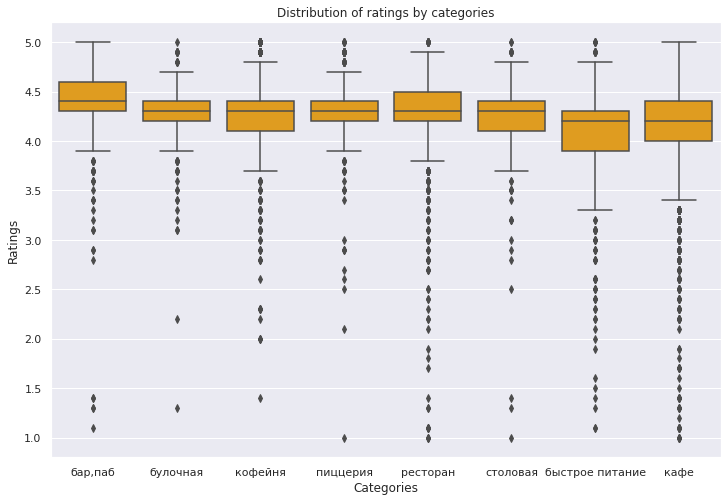

In [30]:
# распределение средних оценок заведений по категориям
sns.set(rc={'figure.figsize':(12,8)})
sns.boxplot(x='category',
            y='rating',
            data=data,
            fliersize=5,
            color='orange',
            order=['бар,паб', 'булочная', 'кофейня', 'пиццерия', 'ресторан', 'столовая', 'быстрое питание', 'кафе'])
plt.title('Distribution of ratings by categories')
plt.xlabel('Categories')
plt.ylabel('Ratings')
plt.show()

### Map of each category average rating

In [31]:
rating_district = pd.DataFrame(data.groupby('district', as_index=False)['rating'].mean().round(3))
rating_district

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240
3,Северо-Восточный административный округ,4.148
4,Северо-Западный административный округ,4.209
5,Центральный административный округ,4.378
6,Юго-Восточный административный округ,4.101
7,Юго-Западный административный округ,4.173
8,Южный административный округ,4.184


In [32]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Average ratings of facilities by districts',
).add_to(m)
m

### All facilities on the map

In [33]:
# карта Москвы со всеми заведениями
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data.apply(create_clusters, axis=1)

m

### Top 15 streets by quantity of facilities

In [34]:
top_15_str_1 = data.pivot_table(index='street', columns='category', values='name', aggfunc='count').sort_values(by=['бар,паб', 'ресторан', 'булочная', 'быстрое питание', 'кафе', 'пиццерия', 'кофейня', 'столовая'])

top_15_str_2 = data.groupby('street')['name'].count().reset_index()
top_15_str_2 = top_15_str_2.sort_values(by='name', ascending=False).head(15)
top_15_str_2.columns=['street', 'all']

top_15_streets = top_15_str_2.merge(right=top_15_str_1, on='street', how='inner')
top_15_streets = top_15_streets.drop('all', axis=1)
top_15_streets = top_15_streets.fillna(0)
top_15_streets

,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,6.0,0.0,7.0,17.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0
9,МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


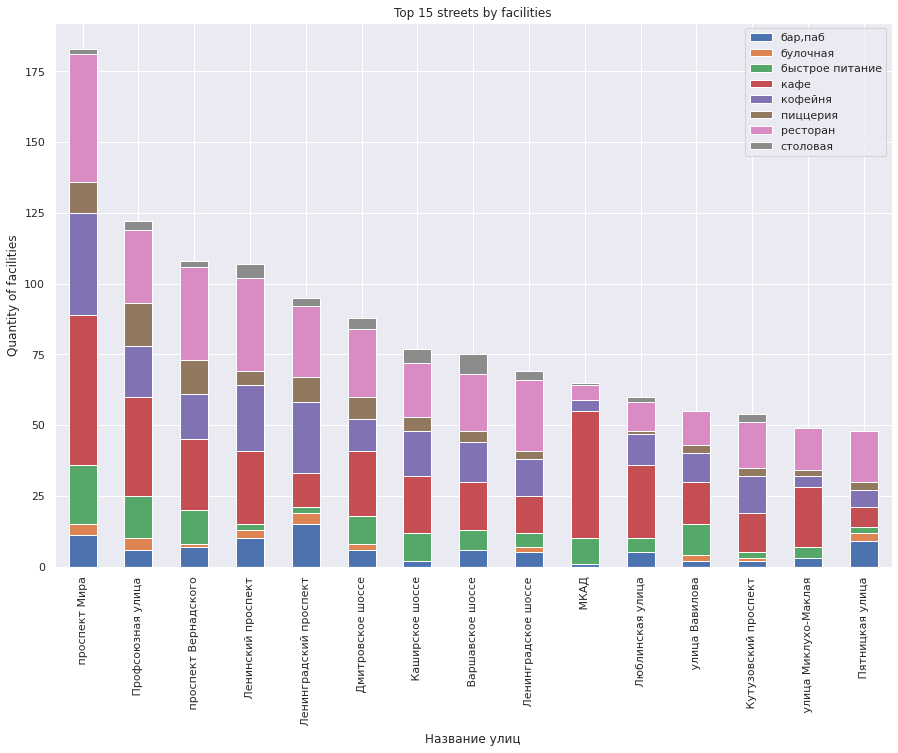

In [35]:
# строим столбчатую диаграмму распределения заведений и их категорий по то 15 улицам Москвы
top_15_streets.plot(x='street', kind='bar', stacked=True, figsize=(15, 10))
plt.title('Top 15 streets by facilities')
plt.xlabel('Street')
plt.ylabel('Quantity of facilities')
plt.show()

### Streets with one facility

In [36]:
streets_1 = data.groupby('street')['name'].count().reset_index()
streets_1 = streets_1[streets_1['name'] == 1]

street_1_place= data.merge(right=streets_1, on='street', how='inner')
street_1_place

,name_x,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_y
0,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False,1
1,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False,1
2,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,1
3,cofefest,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,Новгородская улица,False,1
4,жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False,1
420,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False,1
421,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False,1
422,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False,1


In [37]:
street_1_place_categories = pd.DataFrame(street_1_place.groupby('category')['name_x'].count())
fig = go.Figure(data=[go.Pie(labels=street_1_place_categories.index, values=street_1_place_categories['name_x'])])
fig.update_layout(title='Distribution of categories on streets with one facility')
fig.show()

In [38]:
street_1_place_districts = pd.DataFrame(street_1_place.groupby('district')['name_x'].count())
fig = go.Figure(data=[go.Pie(labels=street_1_place_districts.index, values=street_1_place_districts['name_x'])])
fig.update_layout(title='Distribution of streets with one facilityby district')
fig.show()

### Average bills

In [39]:
middle_avg_bill_district = pd.DataFrame(data.groupby('district', as_index=False)['middle_avg_bill'].median().round())
middle_avg_bill_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [40]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)
m

### Quantity of coffe houses

In [41]:
coffee_houses = data[data['category'] == 'кофейня']
print('Total coffee houses:', len(coffee_houses))

Total coffee houses: 1413


In [42]:
coffee_houses_districts = pd.DataFrame(coffee_houses.groupby('district', as_index=False)['name'].count())
coffee_houses_districts

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [43]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_districts,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Quantity of coffee houses',
).add_to(m)
m